In [3]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
import pickle
import glob

# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

### Helper Functions for Pipeline

In [44]:
def sliding_window_search(binary_warped):
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[int(binary_warped.shape[0]/2):,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image### Helper Functions for Pipeline
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
        (0,255,0), 2)
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
        (0,255,0), 2)
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # Define y-value where we want radius of curvature
    # I'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
    right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
    print(left_curverad, right_curverad)
    # Example values: 1926.74 1908.48

    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])

    # Vehicle position with respect to center
    #calculate the x position for y at the height of the image for left lane
    left_lane_bottom = left_fit_cr[0] * (y_eval * ym_per_pix) ** 2 + left_fit_cr[1] * (y_eval * ym_per_pix) + \
                        left_fit_cr[2]

    #calculate the x position for y at the height of the image for right lane
    right_lane_bottom = right_fit_cr[0] * (y_eval * ym_per_pix) ** 2 + right_fit_cr[1] * (y_eval * ym_per_pix) + \
                         right_fit_cr[2]

    #calculate the mid point of identified lane
    lane_midpoint = float(right_lane_bottom - left_lane_bottom) / 2

    #calculate the image center in meters from left edge of the image to right edge of image
    image_mid_point_in_meter = lane_midpoint * xm_per_pix;

    lane_deviation = (image_mid_point_in_meter - lane_midpoint)

    # Now our radius of curvature is in meters
    print(left_curverad, 'm', right_curverad, 'm')
    # Example values: 632.1 m    626.2 m

    print(image_mid_point_in_meter - img.shape[0]*xm_per_pix/2)

    print(lane_deviation, 'm')

    # out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    # out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    # plt.imshow(out_img)
    # plt.plot(left_fitx, ploty, color='yellow')
    # plt.plot(right_fitx, ploty, color='yellow')
    # plt.xlim(0, 1280)
    # plt.ylim(720, 0)
    # plt.show()

    return left_fitx, right_fitx, ploty, left_curverad, right_curverad, lane_deviation

def warp_perspective(img, M):
    img_size = (img.shape[1], img.shape[0])
    binary_warped = cv2.warpPerspective(img, M, img_size , flags=cv2.INTER_LINEAR)
    return binary_warped

def perspective_transform(src, dst):
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    return M, Minv

def get_birds_eye(binary_img):
    top_left = [570,470]
    top_right = [720,470]
    bottom_right = [1130,720]
    bottom_left = [200,720]
    pts = np.array([bottom_left,bottom_right,top_right,top_left])

    top_left_dst = [320,0]
    top_right_dst = [980,0]
    bottom_right_dst = [980,720]
    bottom_left_dst = [320,720]
    dst_pts = np.array([bottom_left_dst, bottom_right_dst, top_right_dst, top_left_dst])

    # you can plot this and see that lines are properly chosen
    # cv2.polylines(bin_img,[pts],True,(255,0,0), 2)
    # cv2.polylines(img,[dst_pts],True,(0,0,255), 5)

    src = np.float32(pts.tolist())
    dst = np.float32(dst_pts.tolist())

    img_size = (binary_img.shape[1], binary_img.shape[0])

    M, Minv = perspective_transform(src, dst)
    binary_warped = warp_perspective(binary_img, M)

    # binary_warped = cv2.warpPerspective(img, M, img_size , flags=cv2.INTER_LINEAR)
    return binary_warped, Minv

def color_transform_thresh(img, thresh_min=0, thresh_max=255):
    # Convert image to HLS
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]

    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= thresh_min) & (s_channel <= thresh_max)] = 1
    return s_binary

def abs_sobel_thresh(img, orient='x', thresh_min=0, thresh_max=255):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    # Return the result
    return binary_output

def find_lines(img):
    # Threshold x gradient
    sxbinary = abs_sobel_thresh(img, orient='x', thresh_min=20, thresh_max=100)

    # Threshold color channel
    sbinary = color_transform_thresh(img, thresh_min=170, thresh_max=255)

    # Stack each channel to view their individual contributions in green and blue respectively
    # This returns a stack of the two binary images, whose components you can see as different colors
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, sbinary)) * 255

    # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(sbinary == 1) | (sxbinary == 1)] = 1

    # Uncomment to view binary image
    # plt.imshow(combined_binary, cmap='gray')
    # plt.show()

    # Perform sliding window search, returns binary_warped image (bird's eye view)
    binary_warped, Minv = get_birds_eye(combined_binary)

    # Plotting thresholded images
    # f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    # ax1.set_title('Original Image')
    # ax1.imshow(img)
    #
    # ax2.set_title('Birds-eye-view')
    # ax2.imshow(combined_binary, cmap='gray')
    # plt.show()

    # Perform sliding window search to identify lane lines
    left_fitx, right_fitx, ploty, left_curverad, right_curverad, lane_deviation = sliding_window_search(binary_warped)

    # Load camera calibration data
    pickle_data = pickle.load(open('wide_dist_pickle.p', 'rb'))
    mtx = pickle_data["mtx"]
    dist = pickle_data["dist"]

    # Undistort image with calibration data
    undist = cv2.undistort(img, mtx, dist, None, mtx)

    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0]))
    # Combine the result with the original image
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(result,"Radius of Curvature = ",(20,40), font, 1, (255,255,255), 2, cv2.LINE_AA)
    cv2.putText(result,str(int(left_curverad)) + "m",(400,40), font, 1, (255,255,255), 2, cv2.LINE_AA)
    cv2.putText(result,"Vehicle is ",(20,80), font, 1, (255,255,255), 2, cv2.LINE_AA)
    cv2.putText(result,str(round(lane_deviation, 3)) + "m left of center",(180,80), font, 1, (255,255,255), 2, cv2.LINE_AA)

    plt.imshow(result)
    plt.show()
    return result

### Advanced Lane Line Find Pipeline

4061.3572953245807 4279.061199606642
1326.3514068640848 m 1399.3738192277458 m
-1.894018282712526
-1.6633779239720907 m


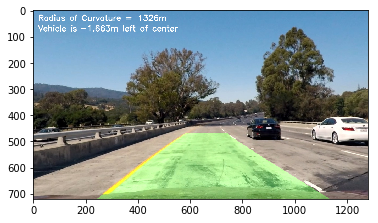

array([[[ 97, 153, 200],
        [ 97, 153, 200],
        [ 97, 153, 200],
        ...,
        [ 88, 150, 197],
        [ 87, 149, 196],
        [ 85, 147, 194]],

       [[ 98, 154, 201],
        [ 97, 153, 200],
        [ 97, 153, 200],
        ...,
        [ 87, 149, 196],
        [ 86, 148, 195],
        [ 85, 147, 194]],

       [[ 98, 154, 201],
        [ 98, 154, 201],
        [ 98, 154, 201],
        ...,
        [ 87, 149, 196],
        [ 86, 148, 195],
        [ 86, 148, 195]],

       ...,

       [[103,  89, 104],
        [104,  90, 104],
        [105,  91, 105],
        ...,
        [126, 107, 100],
        [127, 108, 101],
        [123, 104,  97]],

       [[105,  91, 103],
        [106,  92, 104],
        [107,  92, 105],
        ...,
        [125, 106,  99],
        [125, 106,  99],
        [123, 104,  97]],

       [[110,  94, 105],
        [110,  94, 105],
        [110,  94, 104],
        ...,
        [126, 107, 100],
        [126, 107, 100],
        [125, 107, 100]]

In [46]:
def find_lines(img):
    # Threshold x gradient
    sxbinary = abs_sobel_thresh(img, orient='x', thresh_min=20, thresh_max=100)

    # Threshold color channel
    sbinary = color_transform_thresh(img, thresh_min=170, thresh_max=255)

    # Stack each channel to view their individual contributions in green and blue respectively
    # This returns a stack of the two binary images, whose components you can see as different colors
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, sbinary)) * 255

    # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(sbinary == 1) | (sxbinary == 1)] = 1

    # Uncomment to view binary image
    # plt.imshow(combined_binary, cmap='gray')
    # plt.show()

    # Perform sliding window search, returns binary_warped image (bird's eye view)
    binary_warped, Minv = get_birds_eye(combined_binary)

    # Plotting thresholded images
    # f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    # ax1.set_title('Original Image')
    # ax1.imshow(img)
    #
    # ax2.set_title('Birds-eye-view')
    # ax2.imshow(combined_binary, cmap='gray')
    # plt.show()

    # Perform sliding window search to identify lane lines
    left_fitx, right_fitx, ploty, left_curverad, right_curverad, lane_deviation = sliding_window_search(binary_warped)

    # Load camera calibration data
    pickle_data = pickle.load(open('wide_dist_pickle.p', 'rb'))
    mtx = pickle_data["mtx"]
    dist = pickle_data["dist"]

    # Undistort image with calibration data
    undist = cv2.undistort(img, mtx, dist, None, mtx)

    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0]))
    # Combine the result with the original image
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(result,"Radius of Curvature = ",(20,40), font, 1, (255,255,255), 2, cv2.LINE_AA)
    cv2.putText(result,str(int(left_curverad)) + "m",(400,40), font, 1, (255,255,255), 2, cv2.LINE_AA)
    cv2.putText(result,"Vehicle is ",(20,80), font, 1, (255,255,255), 2, cv2.LINE_AA)
    cv2.putText(result,str(round(lane_deviation, 3)) + "m left of center",(180,80), font, 1, (255,255,255), 2, cv2.LINE_AA)

    plt.imshow(result)
    plt.show()
    return result

# img = mpimg.imread('test_images/test1.jpg')

# find_lines(img)

### Test pipeline with video

3725.330536664163 7767.579291762765
1223.4134006657819 m 2540.0982730987216 m
-1.8936119691664546
-1.7398417407638838 m


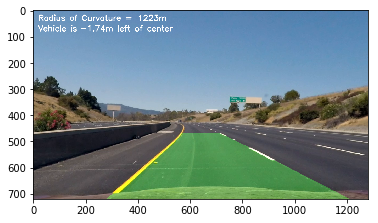

[MoviePy] >>>> Building video output_images/output.mp4
[MoviePy] Writing video output_images/output.mp4


  0%|          | 0/126 [00:00<?, ?it/s]

3725.330536664163 7767.579291762765
1223.4134006657819 m 2540.0982730987216 m
-1.8936119691664546
-1.7398417407638838 m


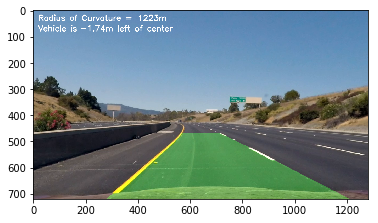

  1%|          | 1/126 [00:00<00:50,  2.46it/s]

3552.818235529139 54026.57796025885
1166.9008289185797 m 17499.30082323272 m
-1.8935779852308952
-1.7462371500422575 m


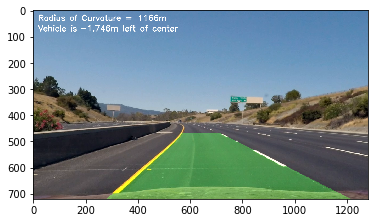

  2%|▏         | 2/126 [00:00<00:48,  2.56it/s]

3195.7159152119802 29138.485655800443
1049.6034715147814 m 9446.36563503441 m
-1.8936021801438558
-1.741683928989681 m


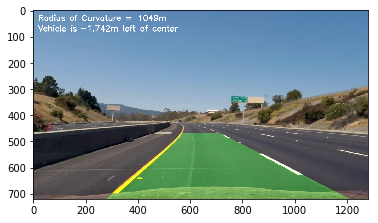

  2%|▏         | 3/126 [00:01<00:47,  2.59it/s]

2822.570401407037 21446.491432044713
926.5948290469585 m 6895.498093553415 m
-1.8935886683703382
-1.7442266986924706 m


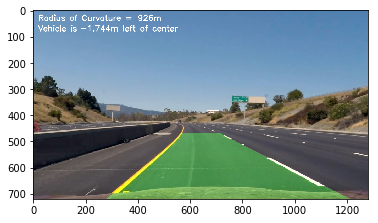

  3%|▎         | 4/126 [00:01<00:47,  2.59it/s]

3351.752410089826 3251.671897107523
1100.796654081722 m 1067.7696312267535 m
-1.8937789020195723
-1.7084267824866257 m


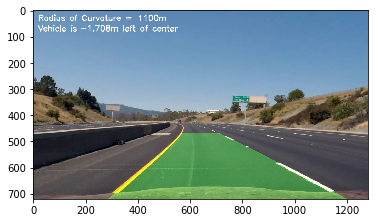

  4%|▍         | 5/126 [00:01<00:46,  2.62it/s]

3731.443007918389 5194.036506290484
1224.7738982363667 m 1698.7663109068403 m
-1.8937852757030023
-1.70722732416977 m


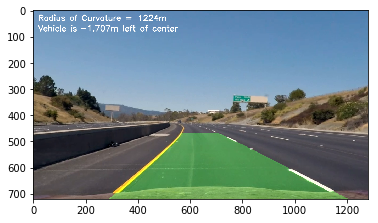

  5%|▍         | 6/126 [00:02<00:45,  2.63it/s]

3961.9332164080265 4482.231526550432
1299.3486687693603 m 1468.4907720178082 m
-1.893822667454279
-1.7001906008146528 m


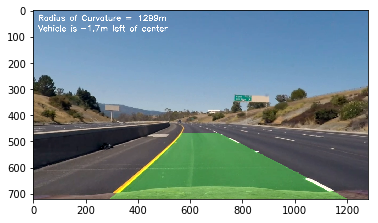

  6%|▌         | 7/126 [00:02<00:45,  2.60it/s]

4003.246638772754 3532.1443292778285
1312.531207829498 m 1159.5844274775495 m
-1.893958709926752
-1.6745888782246716 m


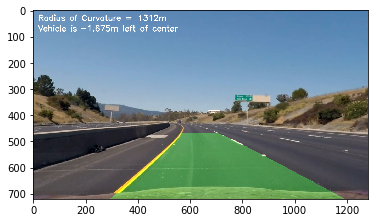

  6%|▋         | 8/126 [00:02<00:43,  2.72it/s]

3986.524399427033 2547.3319046855586
1306.4528410942623 m 836.0300845854063 m
-1.8940154651970713
-1.663908149921072 m


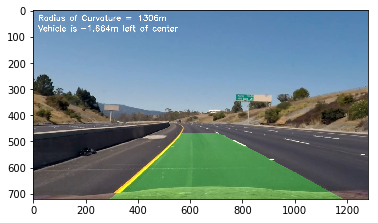

  7%|▋         | 9/126 [00:03<00:41,  2.80it/s]

3933.5322332843816 2185.3892929768253
1288.787789920277 m 715.9404005693114 m
-1.894042245065427
-1.6588684682085846 m


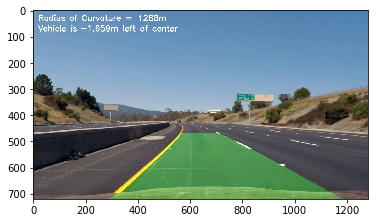

  8%|▊         | 10/126 [00:03<00:40,  2.86it/s]

3589.6084241410417 4407.850210985619
1176.638122881685 m 1439.0457947541722 m
-1.8937824030856927
-1.707767919692142 m


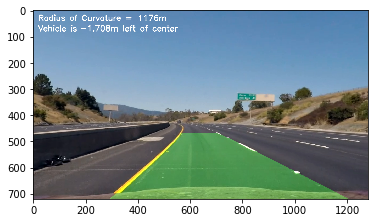

  9%|▊         | 11/126 [00:03<00:39,  2.91it/s]

3585.6715825473616 3975.3031376225067
1174.0415202434576 m 1303.7297271315767 m
-1.893802130403353
-1.7040554517767368 m


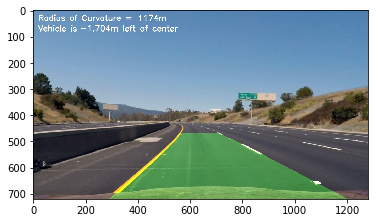

 10%|▉         | 12/126 [00:04<00:39,  2.87it/s]

3582.654972600085 7566.798521189469
1172.912087430726 m 2457.732208909607 m
-1.893693185985265
-1.7245576134833995 m


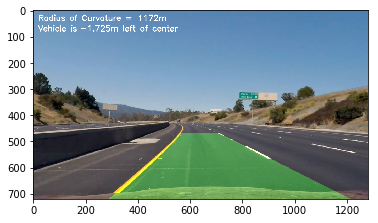

 10%|█         | 13/126 [00:04<00:39,  2.85it/s]

3641.7054191060006 8577.942776854885
1191.0985054442483 m 2673.1193384788417 m
-1.8935345554311191
-1.7544101688487614 m


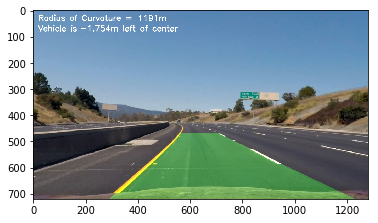

 11%|█         | 14/126 [00:05<00:39,  2.82it/s]

3748.2965952812287 11244.488719395946
1226.1700883319538 m 3521.420505613151 m
-1.8936489253667046
-1.7328869834032992 m


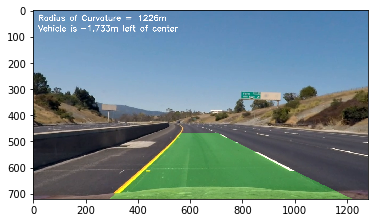

 12%|█▏        | 15/126 [00:05<00:38,  2.88it/s]

4315.0661598787965 12273.228338060439
1408.8790047927434 m 3852.464462583958 m
-1.893779714189369
-1.708273940911101 m


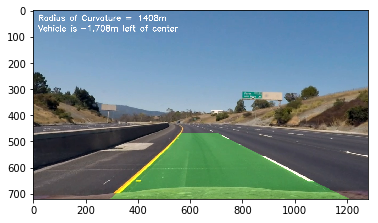

 13%|█▎        | 16/126 [00:05<00:37,  2.92it/s]

4842.383174261129 6805.9028266272735
1578.0511046971749 m 2200.398337030468 m
-1.8939102643802752
-1.6837058063359662 m


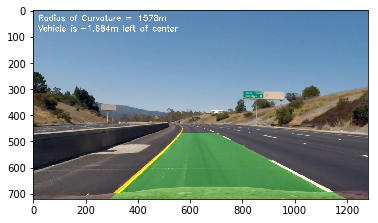

 13%|█▎        | 17/126 [00:06<00:37,  2.88it/s]

6145.9779277899925 13138.600982670301
1994.8588825173608 m 4213.9055937686535 m
-1.8939380477793117
-1.6784772709983526 m


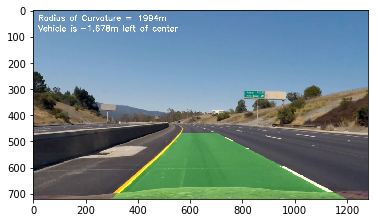

 14%|█▍        | 18/126 [00:06<00:40,  2.65it/s]

6212.432703148727 56244.6710188764
2015.2324431177612 m 17996.93150727159 m
-1.893905003795247
-1.6846957915670835 m


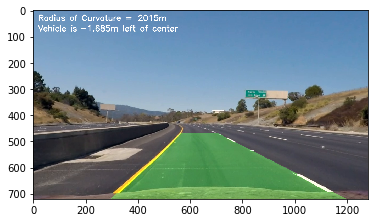

 15%|█▌        | 19/126 [00:06<00:39,  2.73it/s]

6440.226769940758 7533.415725453844
2085.2984922021537 m 2454.2938601859832 m
-1.8940487484563275
-1.6576446003480723 m


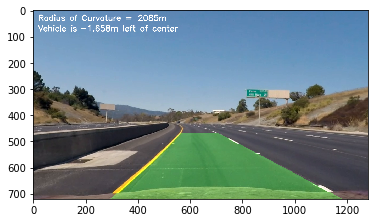

 16%|█▌        | 20/126 [00:07<00:38,  2.76it/s]

9287.443426466063 5168.985095327015
2990.2171312674905 m 1693.9665550695654 m
-1.8941004713777394
-1.6479109057050765 m


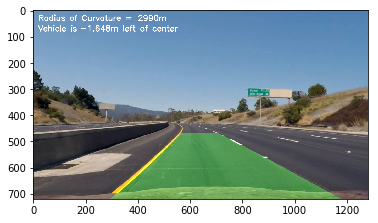

 17%|█▋        | 21/126 [00:07<00:38,  2.73it/s]

9154.131868878545 3495.25347267454
2947.6901251146783 m 1147.9994062760836 m
-1.8941079460133348
-1.646504260092878 m


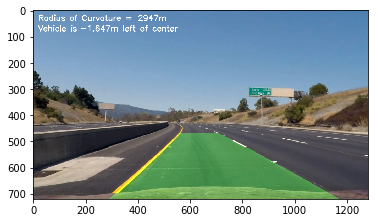

 17%|█▋        | 22/126 [00:08<00:39,  2.67it/s]

30899.13688250365 2297.5657655175773
9864.222192679048 m 751.0710885966295 m
-1.894174999582852
-1.6338855032131778 m


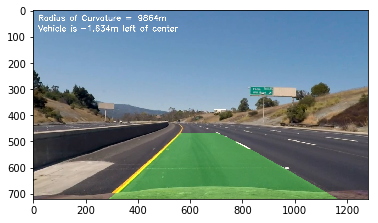

 18%|█▊        | 23/126 [00:08<00:38,  2.69it/s]

13815.713630167798 3736.9737884407227
4444.159690226164 m 1226.6963814810722 m
-1.89395274371082
-1.6757116555634552 m


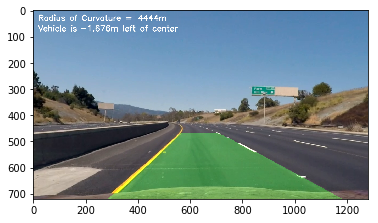

 19%|█▉        | 24/126 [00:08<00:37,  2.75it/s]

8166.382175021177 3987.9436071653395
2646.3609130068694 m 1308.040432090252 m
-1.893885076949725
-1.688445808468946 m


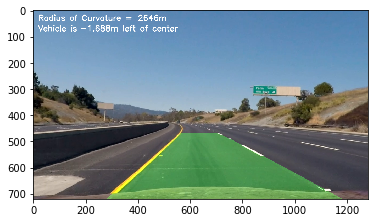

 20%|█▉        | 25/126 [00:09<00:37,  2.70it/s]

7210.493673081158 4379.546380751796
2338.6575786891567 m 1436.769787337093 m
-1.893814056429216
-1.7018111026393485 m


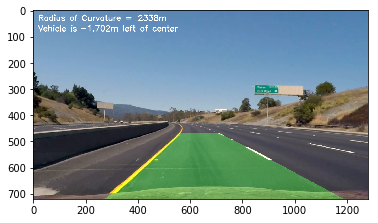

 21%|██        | 26/126 [00:09<00:38,  2.62it/s]

6039.609556541975 13941.017018758377
1965.309457854157 m 4529.047980302115 m
-1.8936431304881816
-1.7339775168939993 m


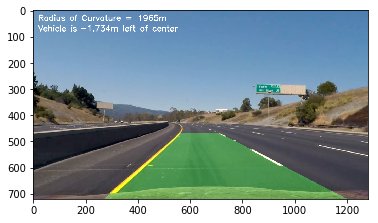

 21%|██▏       | 27/126 [00:09<00:37,  2.62it/s]

5418.722474753611 42908.99033592066
1766.6020691531528 m 13936.832609110952 m
-1.8935580027685837
-1.749997633422685 m


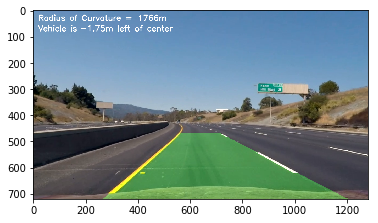

 22%|██▏       | 28/126 [00:10<00:37,  2.61it/s]

5582.714178272247 47566.356389434266
1820.8208762429492 m 15440.927504185014 m
-1.8935905221014027
-1.7438778465464706 m


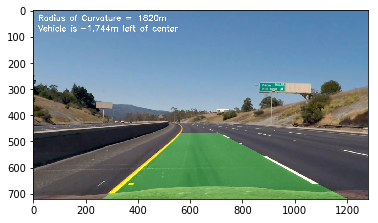

 23%|██▎       | 29/126 [00:10<00:38,  2.49it/s]

5243.109179658195 16446.42802150507
1713.21891955117 m 5350.093367897039 m
-1.8936339791984034
-1.735699690697406 m


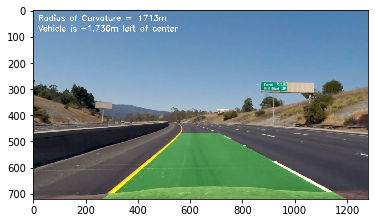

 24%|██▍       | 30/126 [00:11<00:37,  2.55it/s]

5252.566919565036 5129.3750794613015
1717.2675729751095 m 1678.2458894418157 m
-1.8936843251483149
-1.726225127204612 m


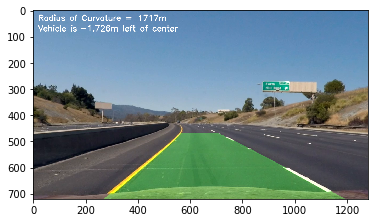

 25%|██▍       | 31/126 [00:11<00:36,  2.59it/s]

4634.846157804261 6514.661564961106
1518.5861496367154 m 2123.6413977798265 m
-1.8937006900923998
-1.723145421646144 m


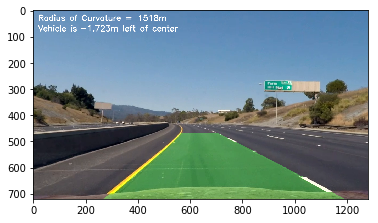

 25%|██▌       | 32/126 [00:11<00:35,  2.62it/s]

4953.272849428034 4915.083864454411
1621.9935972226776 m 1610.3642753144145 m
-1.89373779641724
-1.7161624124606736 m


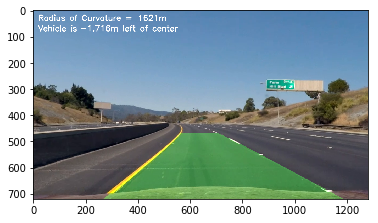

 26%|██▌       | 33/126 [00:12<00:35,  2.65it/s]

3985.041478180313 2689.563427336139
1307.3198929005953 m 882.7493074024462 m
-1.8939012789961829
-1.6853967584828613 m


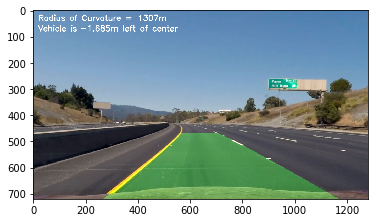

 27%|██▋       | 34/126 [00:12<00:34,  2.68it/s]

5569.786864070947 1901.7653071268642
1822.6584109060866 m 620.5668979826632 m
-1.894030515423552
-1.6610758600025461 m


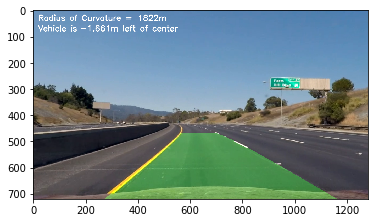

 28%|██▊       | 35/126 [00:12<00:33,  2.70it/s]

4414.169961447867 2643.3436147592033
1447.5865402794968 m 868.2148344428454 m
-1.8938856252215797
-1.6883426296331747 m


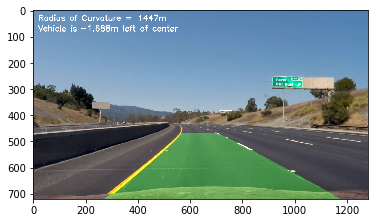

 29%|██▊       | 36/126 [00:13<00:33,  2.71it/s]

3713.663792054042 3486.6226256312866
1219.1500559096626 m 1142.239640939845 m
-1.8937820928758524
-1.7078262978304612 m


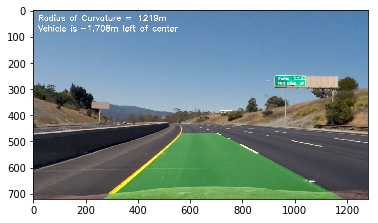

 29%|██▉       | 37/126 [00:13<00:33,  2.66it/s]

3329.807306089149 9310.35566876763
1093.6262811269053 m 2995.0773047947287 m
-1.8936220877576107
-1.7379375312984668 m


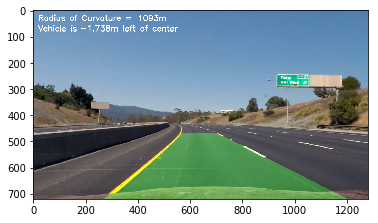

 30%|███       | 38/126 [00:14<00:33,  2.61it/s]

2917.5708882020426 31107.379540109963
958.2376143766129 m 9868.283671518575 m
-1.8936007258897307
-1.7419576038943598 m


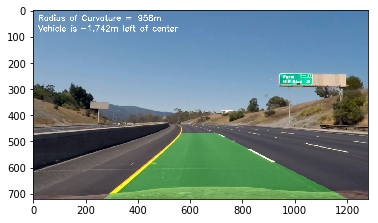

 31%|███       | 39/126 [00:14<00:32,  2.65it/s]

2936.4005140470294 13682.89523830788
964.469999889397 m 4386.321625869331 m
-1.893670165980684
-1.728889729480624 m


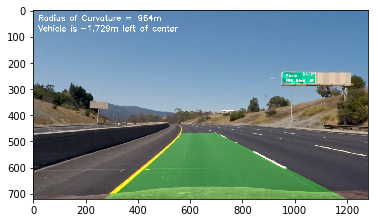

 32%|███▏      | 40/126 [00:14<00:33,  2.54it/s]

2901.4985809513228 18885.53694377134
953.006990646421 m 6046.634267598701 m
-1.893690148771033
-1.725129184367163 m


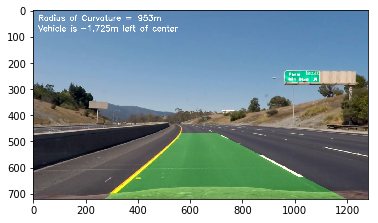

 33%|███▎      | 41/126 [00:15<00:32,  2.64it/s]

2948.9333436517004 6404.047315638909
968.5244272988049 m 2076.517170828729 m
-1.8937628199610932
-1.7114532520323005 m


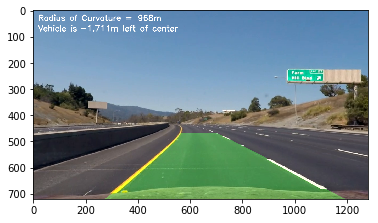

 33%|███▎      | 42/126 [00:15<00:31,  2.69it/s]

3161.2352744007735 4044.2142293872357
1037.6064927201962 m 1320.820159749579 m
-1.8938160076113755
-1.7014439112508104 m


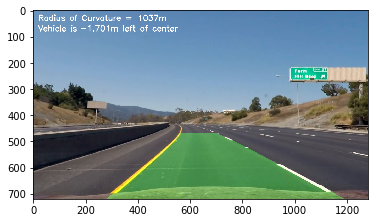

 34%|███▍      | 43/126 [00:15<00:30,  2.68it/s]

3088.220531842191 7231.1758980585
1013.5774911670271 m 2350.864080010034 m
-1.8937744925100393
-1.7092566045103776 m


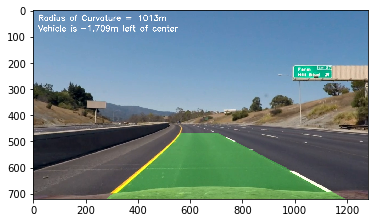

 35%|███▍      | 44/126 [00:16<00:29,  2.77it/s]

3215.926474276509 6436.364179324364
1054.7125357073255 m 2098.240263979654 m
-1.893787874931364
-1.7067381774919057 m


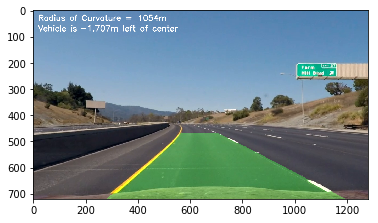

 36%|███▌      | 45/126 [00:16<00:30,  2.70it/s]

2881.2563543984293 4399.4495080639845
945.5956984378744 m 1442.1183049311014 m
-1.8938809326922206
-1.6892257129285024 m


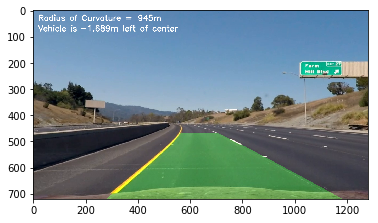

 37%|███▋      | 46/126 [00:17<00:29,  2.70it/s]

3219.720693800093 2592.7500985995225
1055.4418307799506 m 850.9807989654787 m
-1.8939924023266037
-1.668248332814724 m


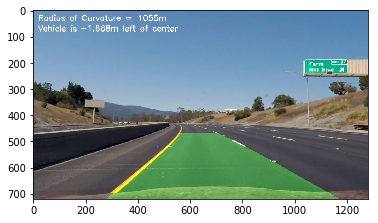

 37%|███▋      | 47/126 [00:17<00:28,  2.78it/s]

3600.4086042494955 1951.6343871297113
1178.4759804553883 m 638.2608046843062 m
-1.8940858758774295
-1.6506576210742092 m


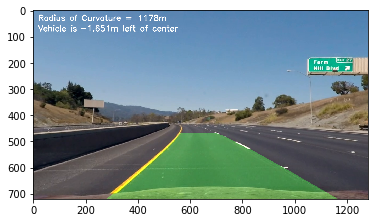

 38%|███▊      | 48/126 [00:17<00:27,  2.79it/s]

3510.9706140107232 2507.028171285695
1148.779989540169 m 823.0628309149301 m
-1.89394665780174
-1.6768569578586643 m


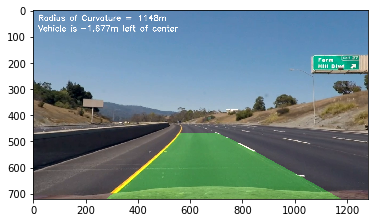

 39%|███▉      | 49/126 [00:18<00:27,  2.85it/s]

3174.669145393001 3173.5329881949415
1039.6508942621556 m 1041.2272446671598 m
-1.8938309058018825
-1.6986402328588868 m


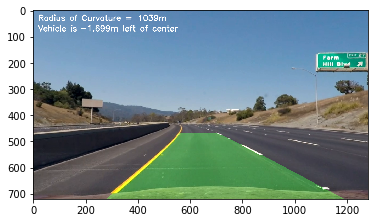

 40%|███▉      | 50/126 [00:18<00:26,  2.83it/s]

3174.7585085434116 4295.789845888685
1039.2093177975778 m 1402.972899264982 m
-1.893762943817428
-1.7114299436090759 m


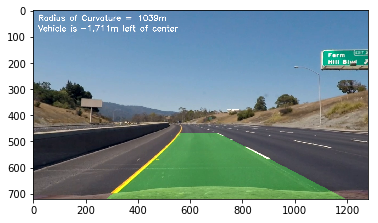

 40%|████      | 51/126 [00:18<00:28,  2.63it/s]

3344.9293199004983 21560.59831900521
1093.3789965268654 m 6886.166573018741 m
-1.8936867462332974
-1.725769505184803 m


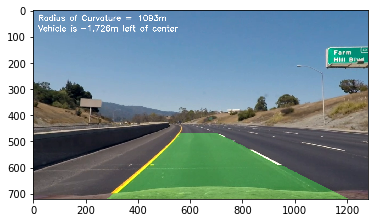

 41%|████▏     | 52/126 [00:19<00:28,  2.60it/s]

3637.2793244575387 277362.86187844985
1187.446728626282 m 88163.30438974318 m
-1.8937274514952813
-1.7181092149362898 m


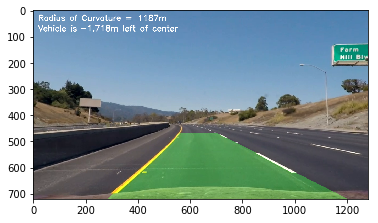

 42%|████▏     | 53/126 [00:19<00:26,  2.72it/s]

3884.326962880968 33737.65901114467
1266.3141410433607 m 10772.826018470609 m
-1.8937805074251948
-1.7081246625042261 m


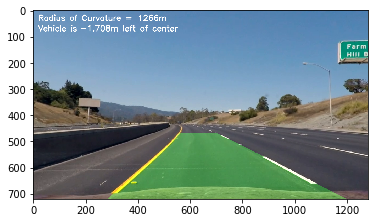

 43%|████▎     | 54/126 [00:19<00:26,  2.70it/s]

4817.004710123659 4596.368152969857
1561.8578944647397 m 1496.8417517918376 m
-1.8938848470979839
-1.6884890640817714 m


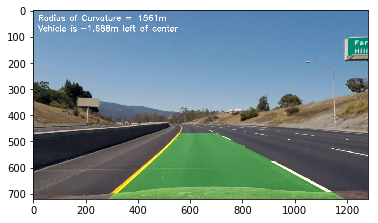

 44%|████▎     | 55/126 [00:20<00:26,  2.72it/s]

6216.403474880916 4469.255887220126
2005.4772359514263 m 1457.1729319038602 m
-1.8938933087083656
-1.6868966804847865 m


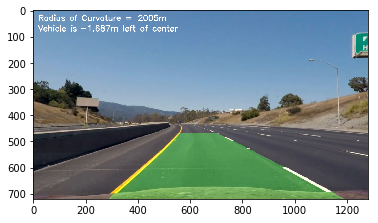

 44%|████▍     | 56/126 [00:20<00:25,  2.71it/s]

6782.0925469247095 5884.213844664037
2185.830125485237 m 1911.3710518812516 m
-1.893879270005209
-1.6895386126490886 m


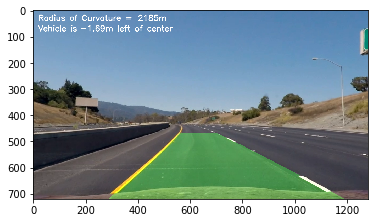

 45%|████▌     | 57/126 [00:21<00:24,  2.77it/s]

7738.318722672769 4633.778783642081
2490.72533451606 m 1514.18788877508 m
-1.8939611820608604
-1.6741236493112381 m


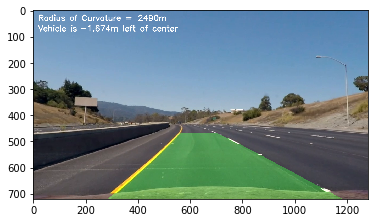

 46%|████▌     | 58/126 [00:21<00:24,  2.74it/s]

10789.039354992967 1826.593422014051
3469.4100425109887 m 597.1228385157647 m
-1.8943146609811397
-1.6076027379084263 m


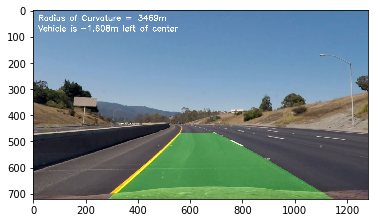

 47%|████▋     | 59/126 [00:21<00:23,  2.80it/s]

12338.498793373812 2147.0067882752887
3972.2775094202193 m 705.1852325116625 m
-1.8942001031592601
-1.6291612815232133 m


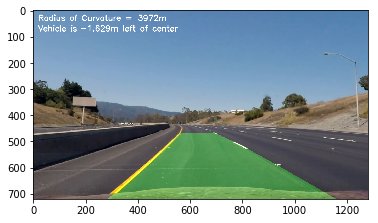

 48%|████▊     | 60/126 [00:22<00:23,  2.78it/s]

9354.84068511294 2466.2538288938367
3025.6467422575856 m 809.1796551431149 m
-1.8941028403274165
-1.647465094986113 m


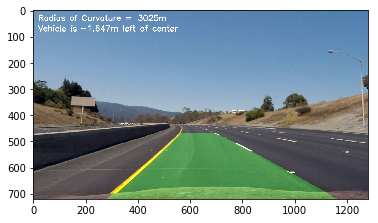

 48%|████▊     | 61/126 [00:22<00:23,  2.78it/s]

8078.97433913878 5231.561876650305
2622.100973617336 m 1679.9433857255915 m
-1.8938770221034384
-1.6899616434606697 m


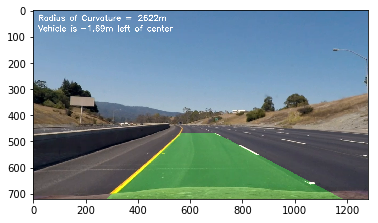

 49%|████▉     | 62/126 [00:22<00:24,  2.62it/s]

6586.509993005794 49497.68832668491
2144.186780749376 m 15471.564268617592 m
-1.893694239721294
-1.7243593117545222 m


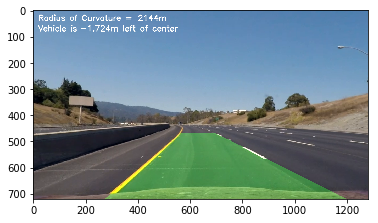

 50%|█████     | 63/126 [00:23<00:23,  2.63it/s]

5667.641124877434 30199.98537493538
1850.423745070298 m 9353.872925168256 m
-1.8936803077576994
-1.7269811566871909 m


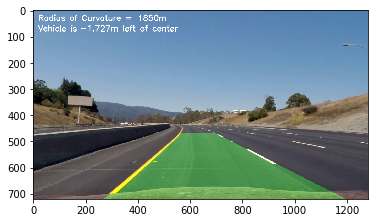

 51%|█████     | 64/126 [00:23<00:22,  2.73it/s]

4929.821340450056 21893.789547638135
1612.2824874327082 m 6823.6660745112085 m
-1.8936855796410925
-1.7259890452259274 m


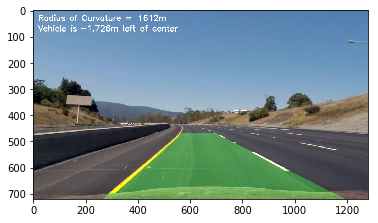

 52%|█████▏    | 65/126 [00:23<00:21,  2.82it/s]

4057.1822637957894 5873.6167143067405
1330.05556154517 m 1892.5179482127696 m
-1.8938029243332926
-1.7039060427451467 m


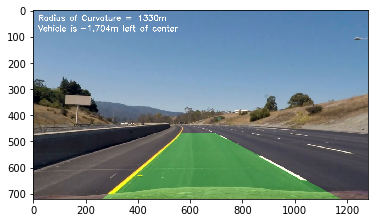

 52%|█████▏    | 66/126 [00:24<00:21,  2.81it/s]

3645.749940748062 9369.659586558992
1196.2569289260537 m 3004.2925899746015 m
-1.893784619430871
-1.707350827490061 m


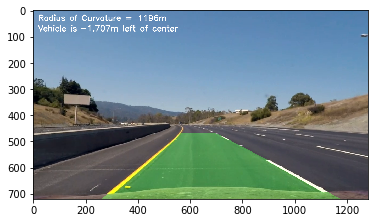

 53%|█████▎    | 67/126 [00:24<00:20,  2.85it/s]

4002.5803514087447 20495.153055827846
1311.9036733297778 m 6552.430051716991 m
-1.8937863431374646
-1.7070264445438093 m


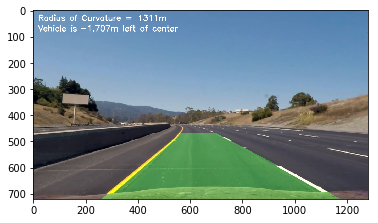

 54%|█████▍    | 68/126 [00:25<00:20,  2.85it/s]

3684.6160449682866 34686.04474355837
1208.9497552753671 m 11051.306940307286 m
-1.893802784712982
-1.7039323177782104 m


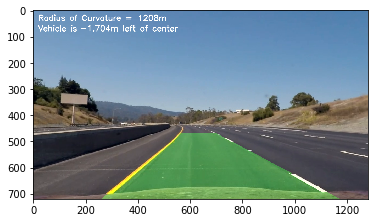

 55%|█████▍    | 69/126 [00:25<00:20,  2.78it/s]

3458.2134384289607 213302.96173588448
1134.958953157135 m 68229.27040872947 m
-1.8937891817656243
-1.7064922454120421 m


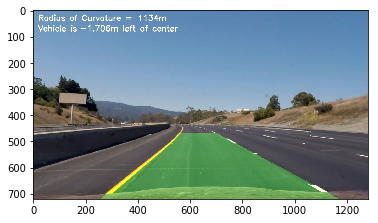

 56%|█████▌    | 70/126 [00:25<00:20,  2.77it/s]

3570.7181039726374 2496.128417499988
1171.4451476010893 m 819.2373296359331 m
-1.8942269224257227
-1.6241141855129875 m


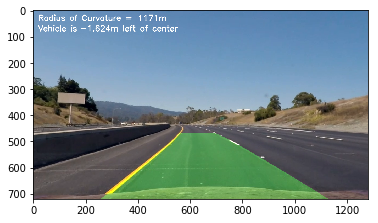

 56%|█████▋    | 71/126 [00:26<00:19,  2.84it/s]

3923.60201469776 2229.270074226011
1285.873253730489 m 730.129675681157 m
-1.8942546820494173
-1.6188901244376743 m


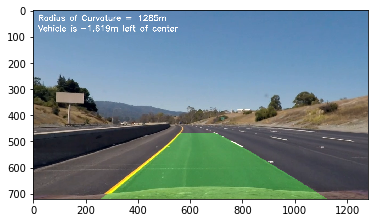

 57%|█████▋    | 72/126 [00:26<00:19,  2.79it/s]

4360.210852013154 3103.535524600282
1427.0102718331523 m 1019.0886749077408 m
-1.8940763273939087
-1.6524545424459607 m


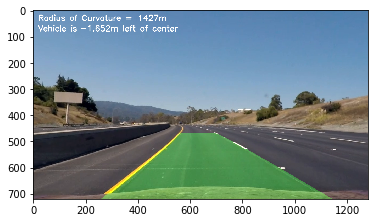

 58%|█████▊    | 73/126 [00:26<00:20,  2.63it/s]

4764.997900557859 4010.6807313364834
1557.2674188604183 m 1313.357371802296 m
-1.8940141862180742
-1.6641488399415294 m


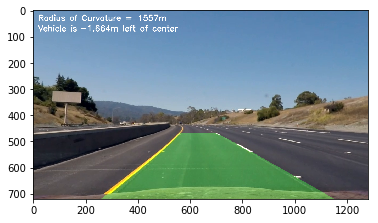

 59%|█████▊    | 74/126 [00:27<00:19,  2.71it/s]

5120.579149456023 4873.138981835324
1670.6252606619414 m 1593.0490415175216 m
-1.893959427419097
-1.6744538539220213 m


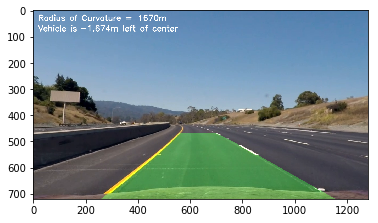

 60%|█████▉    | 75/126 [00:27<00:18,  2.72it/s]

5682.066385272351 7834.097486220146
1850.2680467437267 m 2544.4934749122767 m
-1.8939273288565701
-1.68049445637809 m


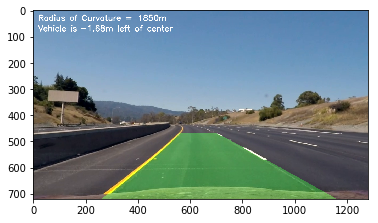

 60%|██████    | 76/126 [00:27<00:18,  2.71it/s]

6202.2270579097385 10748.221216428168
2014.7180497210409 m 3493.6536346460575 m
-1.8938621609574904
-1.6927583504670556 m


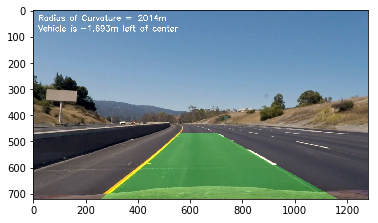

 61%|██████    | 77/126 [00:28<00:18,  2.68it/s]

8869.088473892676 18948.413115208867
2867.8835002109104 m 6147.476326786689 m
-1.893847909960591
-1.6954402340187043 m


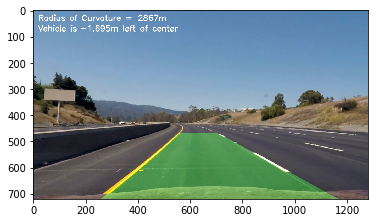

 62%|██████▏   | 78/126 [00:28<00:17,  2.68it/s]

7904.275586100157 9229.484439298103
2560.1662988421604 m 3013.8628060927294 m
-1.8938441713383085
-1.6961438023147355 m


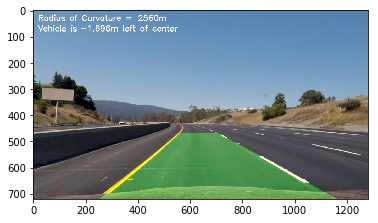

 63%|██████▎   | 79/126 [00:29<00:17,  2.68it/s]

9781.998611507612 34312.057513740656
3162.1182483468997 m 11152.414226359804 m
-1.893829346997113
-1.6989335830645482 m


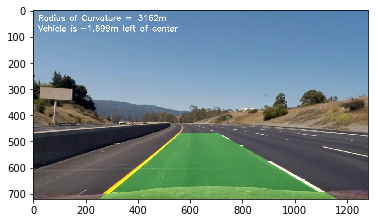

 63%|██████▎   | 80/126 [00:29<00:17,  2.67it/s]

24513.436389451006 4380.611421616353
7874.903168331973 m 1436.8033687349728 m
-1.8939248719390238
-1.6809568216990334 m


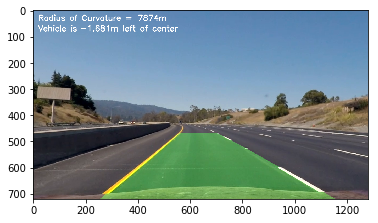

 64%|██████▍   | 81/126 [00:29<00:16,  2.67it/s]

99412.87329873908 7583.5334375076045
31839.535165420308 m 2480.958056628345 m
-1.8938850277276005
-1.6884550715406872 m


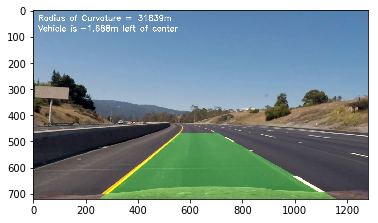

 65%|██████▌   | 82/126 [00:30<00:16,  2.67it/s]

133920.45229227308 9112.908453998785
42889.57951990951 m 2978.2015655269597 m
-1.8938513409845095
-1.6947945524093768 m


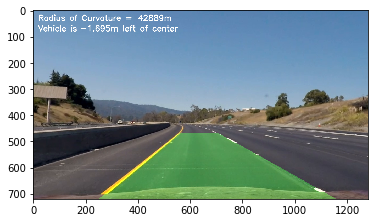

 66%|██████▌   | 83/126 [00:30<00:15,  2.74it/s]

40746.59528330288 7347.932842630023
13085.30541418483 m 2409.276601990249 m
-1.8937701052864995
-1.7100822325511196 m


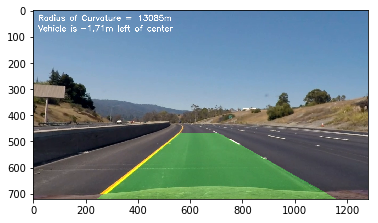

 67%|██████▋   | 84/126 [00:31<00:16,  2.61it/s]

69389.18989211251 6183.09183873278
22310.56730128822 m 2029.0935164839702 m
-1.893768954582922
-1.710298782524369 m


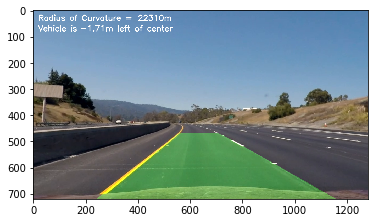

 67%|██████▋   | 85/126 [00:31<00:15,  2.62it/s]

58302.397429743934 2151.72097179958
18808.38909059538 m 701.1269973343209 m
-1.8939336143328946
-1.6793115976849209 m


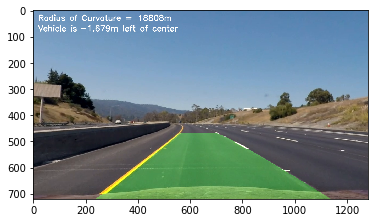

 68%|██████▊   | 86/126 [00:31<00:15,  2.65it/s]

12638.276995785276 2910.4351619576073
4116.7839994453325 m 955.9013699694017 m
-1.8937822310396204
-1.7078002969029835 m


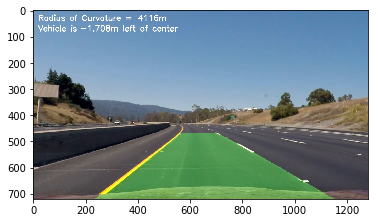

 69%|██████▉   | 87/126 [00:32<00:14,  2.73it/s]

6639.040566197022 6667.1927265317145
2175.685902009436 m 2168.453154998037 m
-1.8935950879342822
-1.743018606158923 m


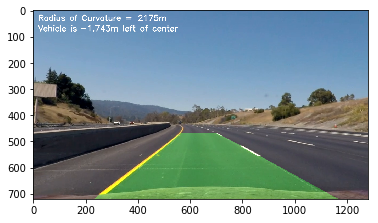

 70%|██████▉   | 88/126 [00:32<00:13,  2.78it/s]

5307.716881082058 495757.19539120496
1742.0047239916316 m 157946.33766195652 m
-1.8934909828001407
-1.7626100669434455 m


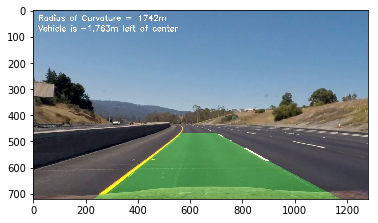

 71%|███████   | 89/126 [00:32<00:13,  2.78it/s]

4743.313075054255 99852.22263932937
1557.7170673977027 m 31702.29152221942 m
-1.8935851848065743
-1.7448822677326905 m


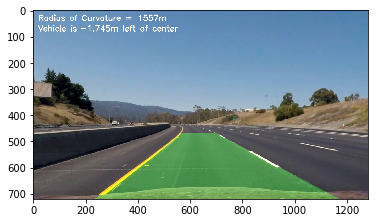

 71%|███████▏  | 90/126 [00:33<00:13,  2.75it/s]

4318.66942838623 8877.976629888031
1418.4559864380221 m 2792.876239496886 m
-1.893540134393664
-1.7533602684109204 m


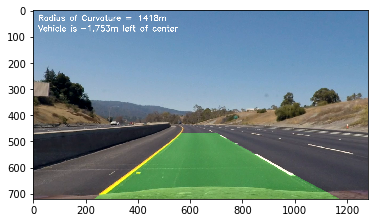

 72%|███████▏  | 91/126 [00:33<00:12,  2.75it/s]

4512.816600045348 9019.893629412347
1482.0483119526084 m 2927.5139531989666 m
-1.8936854523930442
-1.7260129919329785 m


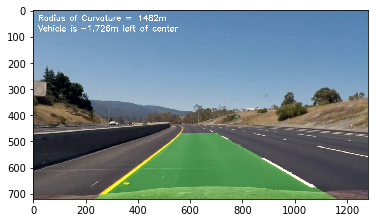

 73%|███████▎  | 92/126 [00:33<00:12,  2.75it/s]

4656.666548211775 9908.212911727771
1529.2029638186877 m 3211.806472628425 m
-1.8937398581692642
-1.7157744130189507 m


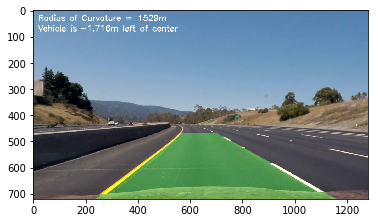

 74%|███████▍  | 93/126 [00:34<00:12,  2.73it/s]

4385.275667740424 9821.849869212854
1440.2577799757917 m 3185.760756306474 m
-1.8937704405318139
-1.710019143007228 m


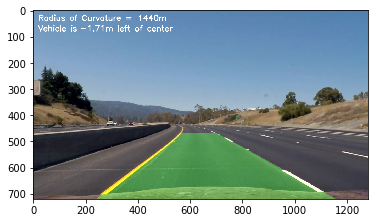

 75%|███████▍  | 94/126 [00:34<00:11,  2.74it/s]

4333.848101794106 21266.599736034597
1423.2860335829025 m 6890.764763176336 m
-1.8937859556871655
-1.7070993585014538 m


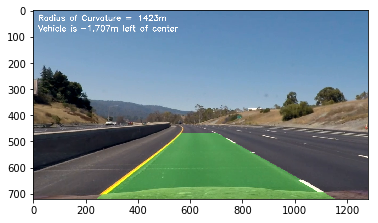

 75%|███████▌  | 95/126 [00:35<00:11,  2.61it/s]

4226.196629027663 3316.9550486898015
1387.944439766121 m 1089.1096995225298 m
-1.8941002615071765
-1.6479504010761474 m


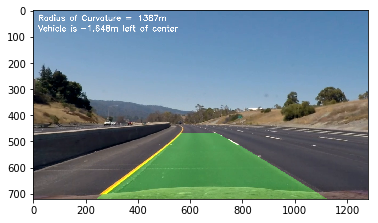

 76%|███████▌  | 96/126 [00:35<00:11,  2.72it/s]

4362.817119977197 2429.267643036168
1432.6149228837128 m 795.8422314282664 m
-1.8941428081496359
-1.6399435829289797 m


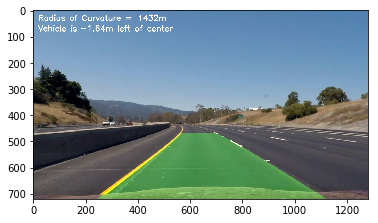

 77%|███████▋  | 97/126 [00:35<00:10,  2.81it/s]

4644.507079674429 2498.622509875163
1524.4853797988587 m 818.0924600113472 m
-1.894123563595898
-1.6435651998932161 m


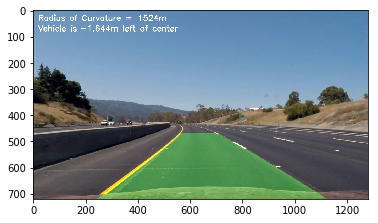

 78%|███████▊  | 98/126 [00:36<00:09,  2.83it/s]

4253.837547920122 3347.80130161605
1396.7744687883705 m 1099.4847288632352 m
-1.893988698588157
-1.6689453363499676 m


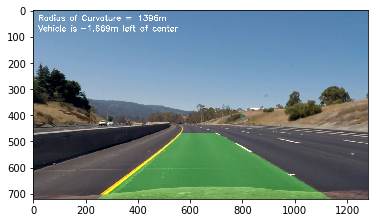

 79%|███████▊  | 99/126 [00:36<00:09,  2.74it/s]

4255.669653059862 3268.241095552152
1397.3754315843812 m 1073.4637173037092 m
-1.8939788004453486
-1.6708080598195956 m


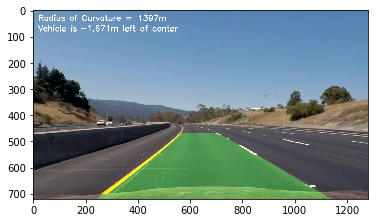

 79%|███████▉  | 100/126 [00:36<00:09,  2.62it/s]

3877.2760917335545 4737.229871973516
1273.4064273701958 m 1552.6579163147278 m
-1.8939013809845404
-1.685377565376542 m


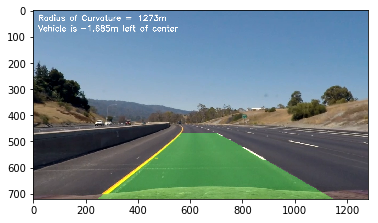

 80%|████████  | 101/126 [00:37<00:09,  2.58it/s]

3940.9713023529735 6970.38068005234
1294.3155396165735 m 2275.47718555938 m
-1.893879643153192
-1.6894683902327674 m


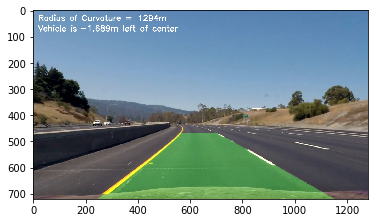

 81%|████████  | 102/126 [00:37<00:09,  2.58it/s]

3840.8800502013564 10084.102439567627
1261.4823311367518 m 3284.008572713472 m
-1.8938560469177428
-1.693908946649819 m


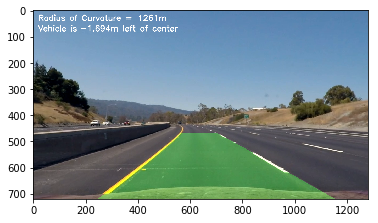

 82%|████████▏ | 103/126 [00:38<00:08,  2.57it/s]

4331.601174244778 7575.167081730713
1421.9176556344034 m 2474.817587462876 m
-1.893918487524202
-1.682158299547757 m


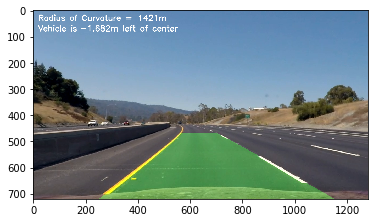

 83%|████████▎ | 104/126 [00:38<00:08,  2.58it/s]

4434.8994728621665 14819.077666048497
1455.3113898675267 m 4834.8807055719035 m
-1.8938597956330192
-1.6932034789614778 m


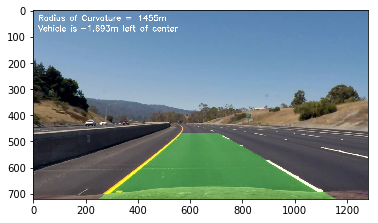

 83%|████████▎ | 105/126 [00:38<00:08,  2.61it/s]

5257.169192824979 4963.015053423261
1722.472154172545 m 1628.840794197981 m
-1.8939052970844352
-1.6846405977125412 m


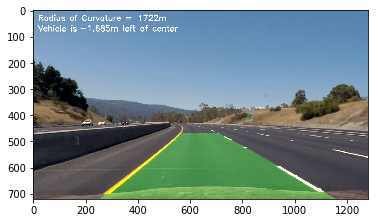

 84%|████████▍ | 106/126 [00:39<00:08,  2.48it/s]

5304.193728742481 5242.7806906224905
1737.5847051015744 m 1721.114629764336 m
-1.893867466983427
-1.6917598137482521 m


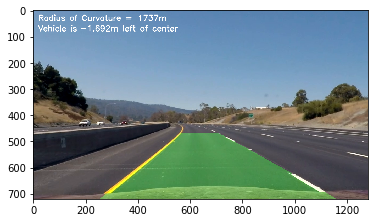

 85%|████████▍ | 107/126 [00:39<00:07,  2.60it/s]

4907.180478254526 8668.246933968303
1609.1882490740963 m 2837.929162077174 m
-1.893859946448571
-1.6931750971050459 m


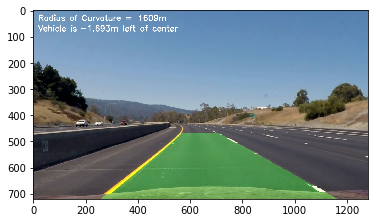

 86%|████████▌ | 108/126 [00:39<00:06,  2.62it/s]

5029.839013652115 7748.158890465707
1649.175502430258 m 2538.0575594647667 m
-1.8938612137026276
-1.692936613591645 m


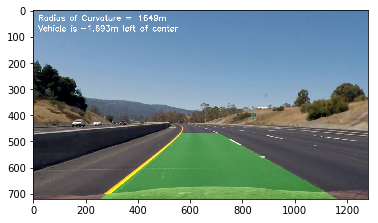

 87%|████████▋ | 109/126 [00:40<00:06,  2.62it/s]

4988.039825754798 2928.399743118529
1635.788488392983 m 960.185271257818 m
-1.894006133414567
-1.665664290504254 m


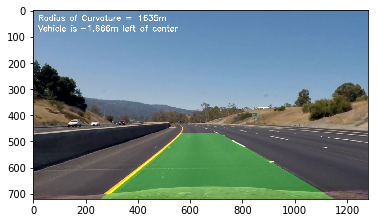

 87%|████████▋ | 110/126 [00:40<00:06,  2.61it/s]

5622.429424666984 2504.1523066248274
1842.730431594482 m 820.1934271474821 m
-1.8940303809898598
-1.6611011589700757 m


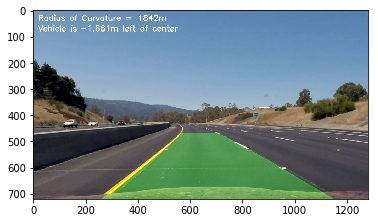

 88%|████████▊ | 111/126 [00:41<00:05,  2.64it/s]

5032.116825047685 2980.778562371359
1649.8845888405897 m 977.3183847252757 m
-1.8939184922320984
-1.6821574135726018 m


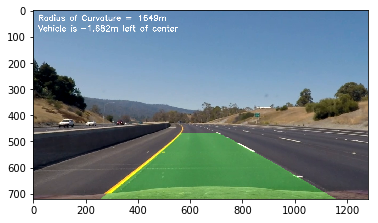

 89%|████████▉ | 112/126 [00:41<00:05,  2.64it/s]

4235.94622855135 4028.1950745431504
1390.685894299683 m 1322.7065080277075 m
-1.893818559895405
-1.7009635989887217 m


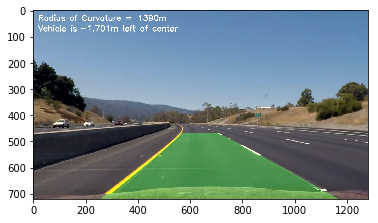

 90%|████████▉ | 113/126 [00:41<00:04,  2.72it/s]

3745.9557187155974 10336.401686855676
1230.2712713384763 m 3367.0218425393937 m
-1.8936872082835745
-1.7256825523177846 m


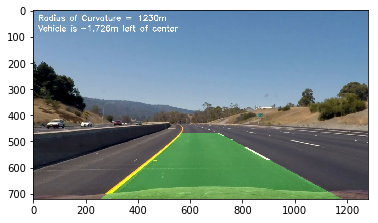

 90%|█████████ | 114/126 [00:42<00:04,  2.79it/s]

3317.0714981309443 107487.17019474694
1089.4206610634358 m 34643.93730278088 m
-1.8936536886821376
-1.7319905789341319 m


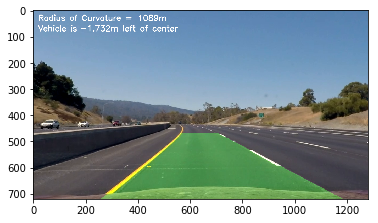

 91%|█████████▏| 115/126 [00:42<00:04,  2.72it/s]

3612.2319530585637 15894.26011075011
1186.429377910532 m 5160.268394558812 m
-1.8937599346846283
-1.711996229870798 m


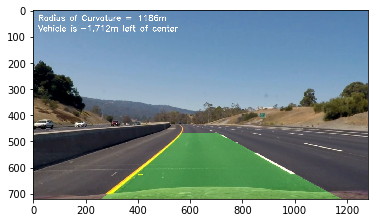

 92%|█████████▏| 116/126 [00:42<00:03,  2.71it/s]

3647.1267895500882 13664.603660606317
1197.8685818414176 m 4446.748441195197 m
-1.8937838326083807
-1.7074988989765332 m


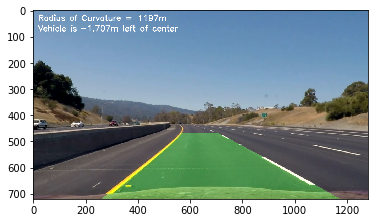

 93%|█████████▎| 117/126 [00:43<00:03,  2.64it/s]

3888.765049754644 3440.2465896952067
1276.8291891021443 m 1129.5974725092428 m
-1.89389628528669
-1.686336520623365 m


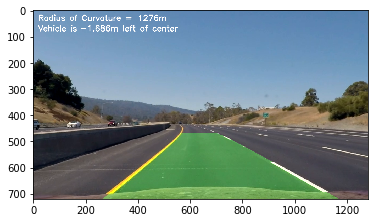

 94%|█████████▎| 118/126 [00:43<00:03,  2.61it/s]

3975.612762962204 4926.154968082133
1305.2128633096827 m 1614.1540573765913 m
-1.893880461240103
-1.6893144351202634 m


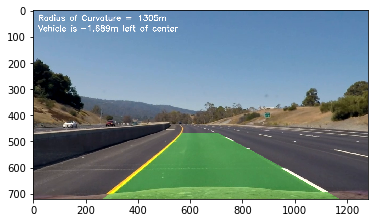

 94%|█████████▍| 119/126 [00:44<00:02,  2.66it/s]

3609.077242764405 4697.808828263362
1185.3035703835383 m 1538.340688409493 m
-1.893888190254317
-1.6878599182020861 m


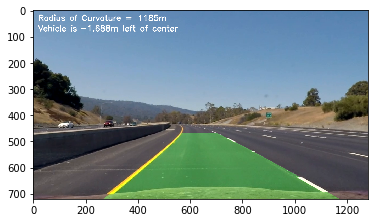

 95%|█████████▌| 120/126 [00:44<00:02,  2.69it/s]

3660.6631193415233 4653.728635819296
1202.1073315981516 m 1525.591257183137 m
-1.8938975709075159
-1.6860945806825438 m


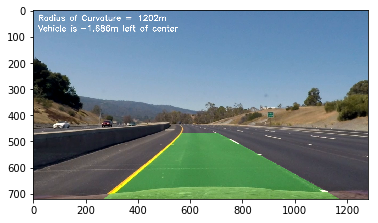

 96%|█████████▌| 121/126 [00:44<00:01,  2.65it/s]

3664.513081996043 2471.6500751851368
1203.363508724583 m 811.7881483733437 m
-1.8939352900171083
-1.6789962520314123 m


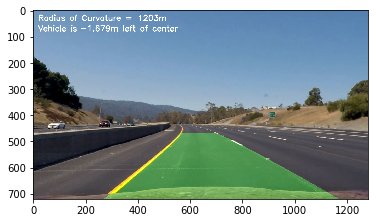

 97%|█████████▋| 122/126 [00:45<00:01,  2.68it/s]

3420.8651059325753 2587.0675739542176
1123.5509617699677 m 849.7294517263887 m
-1.8940028374756364
-1.6662845505792125 m


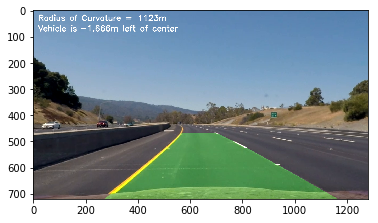

 98%|█████████▊| 123/126 [00:45<00:01,  2.69it/s]

3409.029889594743 2932.03310783869
1119.6828564298053 m 961.9978397120839 m
-1.8939182490897621
-1.6822031703317013 m


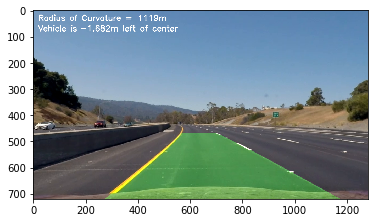

 98%|█████████▊| 124/126 [00:45<00:00,  2.71it/s]

3323.135664520511 3701.153190077306
1091.4893891595673 m 1209.4357942315762 m
-1.8938558148143279
-1.6939526260032958 m


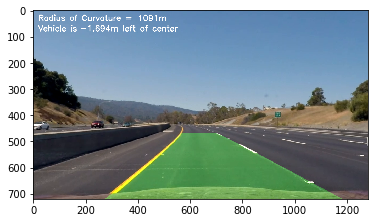

 99%|█████████▉| 125/126 [00:46<00:00,  2.66it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_images/output.mp4 

CPU times: user 1min 27s, sys: 30.2 s, total: 1min 57s
Wall time: 46.8 s


In [48]:
video_output = 'output_images/output.mp4'
video_input = 'project_video.mp4'

clip1 = VideoFileClip(video_input).subclip(0,5)
clip = clip1.fl_image(find_lines) #NOTE: this function expects color images!!

%time clip.write_videofile(video_output, audio=False)
